<a href="https://colab.research.google.com/github/anura-g/models/blob/master/DCGAN_FACES_50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as dataset
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import torch.utils.data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
#Define variables
nc = 3
ngpu = 1
nz = 100
ndf = 32
ngf = 128
lr_D = 2e-4
lr_G = 2e-4
BATCH_SIZE = 100
EPOCHS = 50
img_size = 64
dataroot = "/content/drive/My Drive/mydata/"


In [0]:
#Loading in the data

datasett = dataset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(img_size),
                               transforms.CenterCrop(img_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, ), (0.5, )),
                           ]))

dataloader = torch.utils.data.DataLoader(datasett, batch_size=BATCH_SIZE, shuffle=True)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100, 3, 64, 64])
(3, 860, 530)


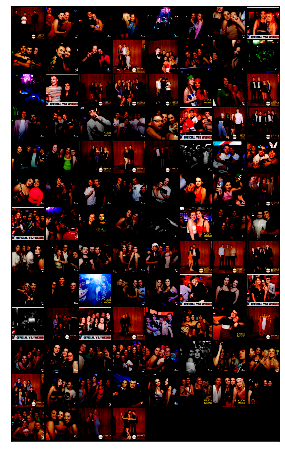

In [5]:
#Visualise the dataset
data_iterator = iter(dataloader)

images, labels = data_iterator.next()
testbatch = images.view(images.size(0), -1)

print(images.size())

def imshow(img):
  im = torchvision.utils.make_grid(img)
  npimg = im.cpu().numpy()
  print(npimg.shape)
  plt.figure(figsize=(8,8))
  plt.imshow(np.transpose(npimg, (1, 2, 0)))
  plt.xticks([])
  plt.yticks([])
  plt.show()

imshow(images)

In [0]:
#NOW DOING THE WEIGHT INTIALISATION
def init_weights(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
#Defining generator

class Generator(nn.Module):
  def __init__(self, ngpu):
    super(Generator,self).__init__()
    self.ngpu = ngpu
    self.model = nn.Sequential(
      # input is Z, going into a convolution
      nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
      nn.BatchNorm2d(ngf * 8),
      nn.ReLU(True),
     
      nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
      nn.BatchNorm2d(ngf * 4),
      nn.ReLU(True),
     
      nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
      nn.BatchNorm2d(ngf * 2),
      nn.ReLU(True),
  
      nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
      nn.BatchNorm2d(ngf),
      nn.ReLU(True),
   
      nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
      nn.Tanh()
    
  
    )
  def forward(self, input):
    return self.model(input)

In [8]:
G = Generator(ngpu).to(device)
G
G.apply(init_weights)

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()

In [0]:
#Defining Discriminator

class Discriminator(nn.Module):
  def __init__(self, ngpu):
    super(Discriminator, self).__init__()
    self.ngpu = ngpu
    self.model = nn.Sequential(

    nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
    nn.BatchNorm2d(ndf * 2),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
    nn.BatchNorm2d(ndf * 4),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
    nn.BatchNorm2d(ndf * 8),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
    nn.Sigmoid(),   
    )

  def forward(self, input):
    return self.model(input)

In [10]:
D = Discriminator(ngpu).to(device)
D
D.apply(init_weights)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [0]:
#Loss function and optimiser
loss_function = nn.BCELoss()

# Lists to keep track of progress
G_loss_avg = 0.0
D_loss_avg = 0.0


real_label = 1
fake_label = 0
fixed_noise = torch.randn(BATCH_SIZE, nz, 1, 1, device=device)

# Setup Adam optimizers for both G and D
G_solver = optim.Adam(G.parameters(), lr=lr_G, betas=(0.5, 0.999))
D_solver = optim.Adam(D.parameters(), lr=lr_D, betas=(0.5, 0.999))

Starting Training Loop...


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([100])) that is different to the input size (torch.Size([100, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


0 1 26 1.8873884677886963 1.8144193887710571
0 2 26 4.113487720489502 0.4188341200351715
0 3 26 4.395751476287842 0.4528070092201233
0 4 26 4.386309623718262 0.5732364654541016
0 5 26 3.9270107746124268 0.8969653844833374
0 6 26 3.690188407897949 1.2009423971176147
0 7 26 3.567837953567505 1.4032621383666992
0 8 26 3.801050901412964 1.4867831468582153
0 9 26 3.8256635665893555 1.7183525562286377
0 10 26 3.9354186058044434 1.895423412322998
0 11 26 3.826681613922119 2.3475821018218994
0 12 26 3.3592023849487305 2.833603620529175
0 13 26 3.2345519065856934 3.0054187774658203
0 14 26 3.0699164867401123 3.1466188430786133
0 15 26 3.2476818561553955 3.4432873725891113
0 16 26 3.105593681335449 3.596978187561035
0 17 26 3.2474143505096436 3.519155979156494
0 18 26 3.3361291885375977 3.7760355472564697
0 19 26 2.9930362701416016 4.048746109008789
0 20 26 2.507567882537842 4.243116855621338
0 21 26 2.399937152862549 4.326719760894775
0 22 26 2.7838315963745117 4.437763690948486
0 23 26 2.47480

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([76])) that is different to the input size (torch.Size([76, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 26 26 2.2265772819519043 4.990902423858643
Epoch: 0, D_Loss: 2.2265772819519043, G_Loss: 4.990902423858643
(3, 860, 530)


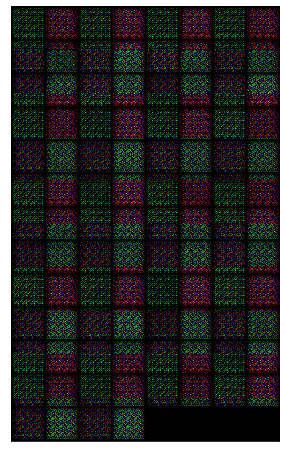

1 1 26 1.6904406547546387 5.041458606719971
1 2 26 1.5194664001464844 4.7418341636657715
1 3 26 1.9466240406036377 4.787172317504883
1 4 26 1.5662645101547241 5.160378932952881
1 5 26 1.7178845405578613 5.246289253234863
1 6 26 2.0720431804656982 5.403790473937988
1 7 26 1.598238229751587 5.463146209716797
1 8 26 1.4301248788833618 4.968392848968506
1 9 26 2.347609519958496 4.906806468963623
1 10 26 1.9371196031570435 5.137091636657715
1 11 26 1.77988600730896 4.7758402824401855
1 12 26 1.8906335830688477 5.023035049438477
1 13 26 1.5725769996643066 4.977884769439697
1 14 26 1.6088762283325195 5.232244968414307
1 15 26 1.6168105602264404 5.458041191101074
1 16 26 1.5980515480041504 4.973799705505371
1 17 26 1.2425997257232666 4.947287559509277
1 18 26 1.3288135528564453 5.268048286437988
1 19 26 1.0309675931930542 5.297247409820557
1 20 26 1.2971735000610352 5.574116230010986
1 21 26 1.311821699142456 6.210595607757568
1 22 26 1.276611328125 5.755887985229492
1 23 26 1.5813415050506592

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1 26 26 1.361750841140747 5.5738677978515625
Epoch: 1, D_Loss: 1.361750841140747, G_Loss: 5.5738677978515625
(3, 860, 530)


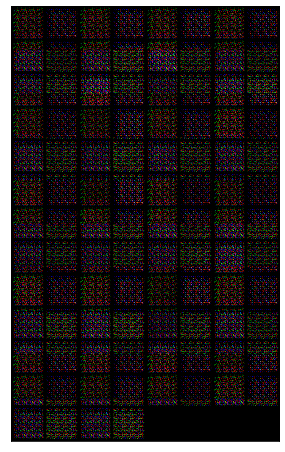

2 1 26 1.2815093994140625 5.300390720367432
2 2 26 1.426011323928833 4.813108921051025
2 3 26 1.2747052907943726 4.254601001739502
2 4 26 1.386394739151001 4.026064872741699
2 5 26 1.303948163986206 4.091243743896484
2 6 26 1.1496292352676392 4.081976890563965
2 7 26 1.1700282096862793 3.974884033203125
2 8 26 1.3061878681182861 3.7720305919647217
2 9 26 1.4071142673492432 4.452719211578369
2 10 26 1.5621659755706787 4.706553936004639
2 11 26 1.6762254238128662 5.2019548416137695
2 12 26 1.5769314765930176 4.986281871795654
2 13 26 1.5541911125183105 4.730819225311279
2 14 26 1.4018166065216064 4.719137668609619
2 15 26 1.3503241539001465 4.487136363983154
2 16 26 1.1204737424850464 4.662846088409424
2 17 26 1.2823692560195923 4.97445821762085
2 18 26 1.6310310363769531 5.376593112945557
2 19 26 1.2984142303466797 5.408194541931152
2 20 26 1.0931413173675537 4.871816635131836
2 21 26 1.1817193031311035 4.348142623901367
2 22 26 1.0088235139846802 4.005823135375977
2 23 26 1.05920302867

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2 26 26 1.2941491603851318 3.6919169425964355
Epoch: 2, D_Loss: 1.2941491603851318, G_Loss: 3.6919169425964355
(3, 860, 530)


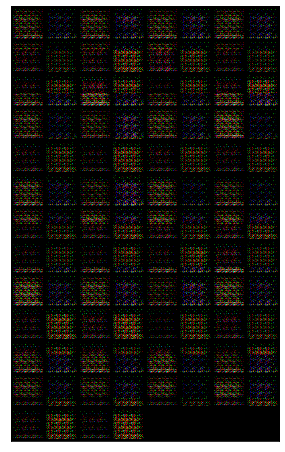

3 1 26 1.2310543060302734 3.903078317642212
3 2 26 1.1994909048080444 3.6637325286865234
3 3 26 1.2296624183654785 4.079469203948975
3 4 26 1.1996887922286987 3.948357582092285
3 5 26 1.0699989795684814 4.16079044342041
3 6 26 1.106755018234253 4.026751518249512
3 7 26 1.0761021375656128 3.8924331665039062
3 8 26 0.7594515085220337 4.2124223709106445
3 9 26 0.800868809223175 4.207952499389648
3 10 26 0.8888423442840576 4.67068338394165
3 11 26 1.062443494796753 4.810558319091797
3 12 26 1.0697705745697021 4.8596296310424805
3 13 26 1.1114232540130615 4.139510154724121
3 14 26 1.2799006700515747 4.536326885223389
3 15 26 1.2469580173492432 4.974688529968262
3 16 26 1.3887438774108887 3.972214460372925
3 17 26 1.196326732635498 3.518085241317749
3 18 26 1.0430500507354736 3.094052791595459
3 19 26 0.9252698421478271 3.0773000717163086
3 20 26 0.8603543639183044 3.1135857105255127
3 21 26 1.082227110862732 2.4650189876556396
3 22 26 1.0794819593429565 2.886432409286499
3 23 26 1.144855856

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


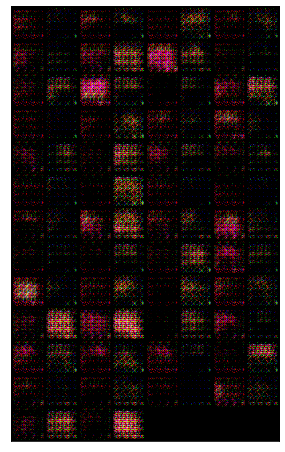

4 1 26 1.6587448120117188 1.4322739839553833
4 2 26 1.316670536994934 2.5268990993499756
4 3 26 1.3502318859100342 2.117119312286377
4 4 26 1.0556895732879639 2.2772271633148193
4 5 26 1.2207202911376953 1.9092952013015747
4 6 26 1.216829538345337 1.9697697162628174
4 7 26 1.0877448320388794 2.0666027069091797
4 8 26 1.3563292026519775 1.8102374076843262
4 9 26 1.068094253540039 2.031886339187622
4 10 26 1.190809726715088 1.9367845058441162
4 11 26 1.1173930168151855 2.0675554275512695
4 12 26 1.4190006256103516 1.5910429954528809
4 13 26 1.1461855173110962 2.4384241104125977
4 14 26 1.052772045135498 2.08994197845459
4 15 26 0.9668987989425659 1.8095262050628662
4 16 26 1.1189608573913574 2.069849729537964
4 17 26 1.3914754390716553 1.4387435913085938
4 18 26 1.1276775598526 2.177170515060425
4 19 26 0.9507007598876953 2.1905055046081543
4 20 26 0.908423900604248 1.8112281560897827
4 21 26 0.9219430685043335 1.9806941747665405
4 22 26 0.903825044631958 1.9312037229537964
4 23 26 1.088

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4 26 26 1.1790599822998047 1.8289076089859009
Epoch: 4, D_Loss: 1.1790599822998047, G_Loss: 1.8289076089859009
(3, 860, 530)


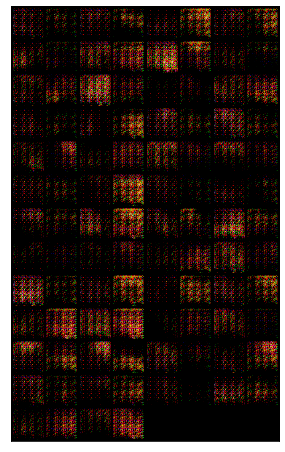

5 1 26 1.373721718788147 1.4823057651519775
5 2 26 1.0697526931762695 2.411158561706543
5 3 26 1.0374464988708496 1.6862832307815552
5 4 26 1.025439977645874 2.2314090728759766
5 5 26 0.9058456420898438 1.828210711479187
5 6 26 0.9924747347831726 1.891127109527588
5 7 26 0.8441567420959473 2.173351526260376
5 8 26 0.8450143337249756 1.5615354776382446
5 9 26 0.7414993643760681 2.7392807006835938
5 10 26 1.2213833332061768 0.9566500782966614
5 11 26 1.2562415599822998 2.088118076324463
5 12 26 0.8918952941894531 2.0975592136383057
5 13 26 1.0081233978271484 1.453564167022705
5 14 26 1.1406457424163818 1.6863998174667358
5 15 26 1.1543999910354614 1.8069586753845215
5 16 26 1.0324766635894775 1.8468921184539795
5 17 26 1.0679198503494263 1.8964948654174805
5 18 26 1.0070164203643799 1.6101841926574707
5 19 26 1.050557255744934 2.361649513244629
5 20 26 1.361672043800354 0.9812464118003845
5 21 26 1.367041826248169 2.5568838119506836
5 22 26 1.449963092803955 1.3484095335006714
5 23 26 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5 26 26 0.9976910352706909 1.7540550231933594
Epoch: 5, D_Loss: 0.9976910352706909, G_Loss: 1.7540550231933594
(3, 860, 530)


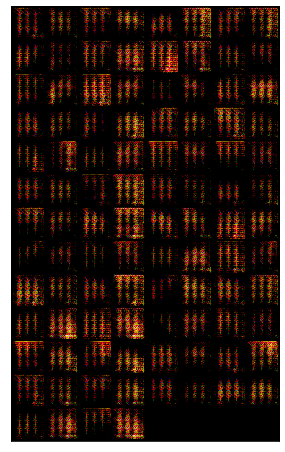

6 1 26 0.9998422861099243 2.2568540573120117
6 2 26 0.7610155344009399 2.145697832107544
6 3 26 1.0335301160812378 1.959771990776062
6 4 26 0.9849013090133667 2.153944969177246
6 5 26 1.1108131408691406 1.5983476638793945
6 6 26 1.1529420614242554 2.1242520809173584
6 7 26 1.3671244382858276 1.1423823833465576
6 8 26 1.2849136590957642 1.9196537733078003
6 9 26 1.2417906522750854 1.5536898374557495
6 10 26 1.0908572673797607 1.6531240940093994
6 11 26 1.2472059726715088 1.6815543174743652
6 12 26 1.1577850580215454 1.3008133172988892
6 13 26 1.092479944229126 1.71271550655365
6 14 26 0.9606469869613647 1.8896175622940063
6 15 26 0.9089027643203735 1.6206496953964233
6 16 26 0.7861416935920715 1.8858953714370728
6 17 26 0.8049806952476501 1.7246344089508057
6 18 26 0.7590831518173218 1.6946911811828613
6 19 26 0.847291111946106 1.843042016029358
6 20 26 0.8146661520004272 1.510844111442566
6 21 26 0.9856646060943604 1.666537880897522
6 22 26 1.0226736068725586 1.5719425678253174
6 23 26

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6 26 26 1.0386900901794434 1.4226385354995728
Epoch: 6, D_Loss: 1.0386900901794434, G_Loss: 1.4226385354995728
(3, 860, 530)


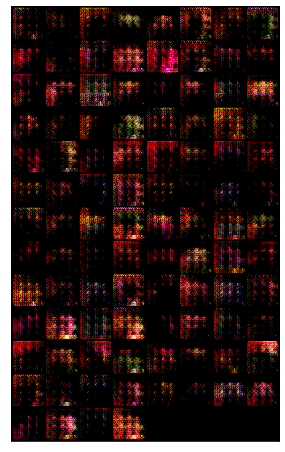

7 1 26 0.8796907067298889 1.7823665142059326
7 2 26 0.8917577266693115 1.5918000936508179
7 3 26 0.8827780485153198 1.683357834815979
7 4 26 0.7789218425750732 1.9282301664352417
7 5 26 0.7732692360877991 1.874569296836853
7 6 26 0.6440587043762207 2.3595895767211914
7 7 26 0.7052921056747437 2.0045220851898193
7 8 26 0.5365796089172363 2.1595239639282227
7 9 26 0.691609263420105 1.9179691076278687
7 10 26 0.7917569875717163 2.11579966545105
7 11 26 0.6986138224601746 2.0833420753479004
7 12 26 0.6666913032531738 2.02791690826416
7 13 26 0.854905366897583 1.9692490100860596
7 14 26 0.8188403844833374 2.1575777530670166
7 15 26 0.8887826204299927 1.9359502792358398
7 16 26 0.8881323933601379 2.0007424354553223
7 17 26 0.9187591671943665 2.1071741580963135
7 18 26 1.025221347808838 1.7234987020492554
7 19 26 1.0632109642028809 1.992580533027649
7 20 26 1.023922324180603 1.666083574295044
7 21 26 0.9521569013595581 2.2377331256866455
7 22 26 0.9057112336158752 2.02518367767334
7 23 26 0.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7 26 26 0.8308429718017578 1.873410701751709
Epoch: 7, D_Loss: 0.8308429718017578, G_Loss: 1.873410701751709
(3, 860, 530)


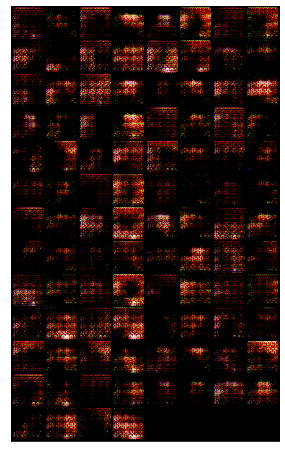

8 1 26 0.8152962923049927 1.5726450681686401
8 2 26 0.9213204979896545 1.854505181312561
8 3 26 1.0596855878829956 1.1704157590866089
8 4 26 0.8786144256591797 1.7919974327087402
8 5 26 0.7576169371604919 1.6381334066390991
8 6 26 0.9094866514205933 1.5650030374526978
8 7 26 0.7297149896621704 1.8294787406921387
8 8 26 0.7710970640182495 1.709336280822754
8 9 26 0.7158310413360596 1.7042419910430908
8 10 26 0.7979831695556641 1.6897681951522827
8 11 26 0.7595686912536621 1.9248113632202148
8 12 26 0.8598120212554932 1.3375746011734009
8 13 26 0.9921334385871887 1.8490469455718994
8 14 26 0.856727123260498 1.340451717376709
8 15 26 0.8415013551712036 2.019624710083008
8 16 26 0.9184144735336304 1.269606351852417
8 17 26 0.8411589860916138 1.8564257621765137
8 18 26 0.8820440769195557 1.5110975503921509
8 19 26 0.7892482280731201 1.637009620666504
8 20 26 0.9261907339096069 1.4453586339950562
8 21 26 0.998920202255249 1.4950958490371704
8 22 26 0.825230598449707 2.175955295562744
8 23 26

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8 26 26 0.7892154455184937 1.926216959953308
Epoch: 8, D_Loss: 0.7892154455184937, G_Loss: 1.926216959953308
(3, 860, 530)


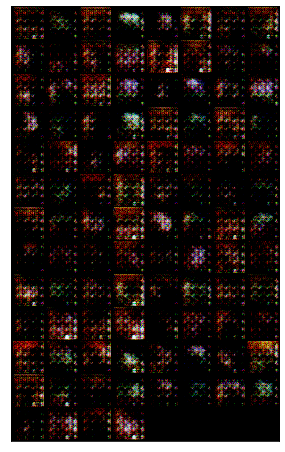

9 1 26 0.8946921825408936 1.5049365758895874
9 2 26 1.043229103088379 2.4243886470794678
9 3 26 0.9279210567474365 1.2922533750534058
9 4 26 0.8122519254684448 2.4011025428771973
9 5 26 0.7230826616287231 2.3504068851470947
9 6 26 1.0135712623596191 1.549471139907837
9 7 26 0.7386461496353149 2.116420030593872
9 8 26 1.0256104469299316 2.4489426612854004
9 9 26 1.3184492588043213 0.813956618309021
9 10 26 1.3795130252838135 2.4700162410736084
9 11 26 1.017449975013733 1.6956428289413452
9 12 26 1.0058655738830566 1.4010456800460815
9 13 26 1.1325750350952148 2.086184501647949
9 14 26 1.2092784643173218 1.232650876045227
9 15 26 1.0038214921951294 2.4951388835906982
9 16 26 0.9968805313110352 1.6684653759002686
9 17 26 0.985952615737915 2.270273447036743
9 18 26 0.9523157477378845 1.7834515571594238
9 19 26 0.7949726581573486 2.8336730003356934
9 20 26 0.6538287997245789 2.159864902496338
9 21 26 0.673427164554596 2.4858689308166504
9 22 26 0.9106011986732483 1.7456578016281128
9 23 26 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9 26 26 0.8754451274871826 2.343707799911499
Epoch: 9, D_Loss: 0.8754451274871826, G_Loss: 2.343707799911499
(3, 860, 530)


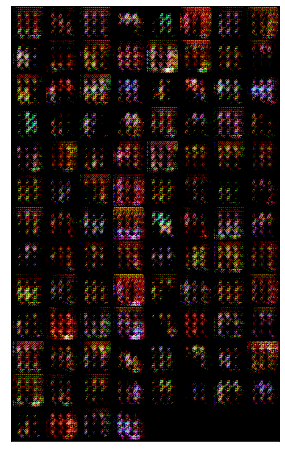

10 1 26 0.7473820447921753 1.693363070487976
10 2 26 1.0068962574005127 1.8911247253417969
10 3 26 0.876251757144928 2.0238964557647705
10 4 26 0.9977166652679443 1.7680063247680664
10 5 26 0.9115810394287109 1.3669991493225098
10 6 26 0.9928053021430969 2.052670955657959
10 7 26 0.9836255311965942 1.5159295797348022
10 8 26 0.9785016775131226 1.886022686958313
10 9 26 0.9242525696754456 1.282488226890564
10 10 26 0.9744746685028076 1.928238034248352
10 11 26 0.8142307996749878 1.9184925556182861
10 12 26 0.7912242412567139 1.7900270223617554
10 13 26 1.0211615562438965 1.4948608875274658
10 14 26 1.069390058517456 2.668147325515747
10 15 26 1.1613179445266724 0.6692540049552917
10 16 26 1.478898048400879 2.6460344791412354
10 17 26 1.1527667045593262 1.6956465244293213
10 18 26 1.0535287857055664 1.1508376598358154
10 19 26 0.9189515113830566 2.0030155181884766
10 20 26 0.7395241260528564 2.226459264755249
10 21 26 0.8279088735580444 1.42291259765625
10 22 26 0.9175978302955627 1.7145

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10 26 26 1.4280097484588623 1.1082425117492676
Epoch: 10, D_Loss: 1.4280097484588623, G_Loss: 1.1082425117492676
(3, 860, 530)


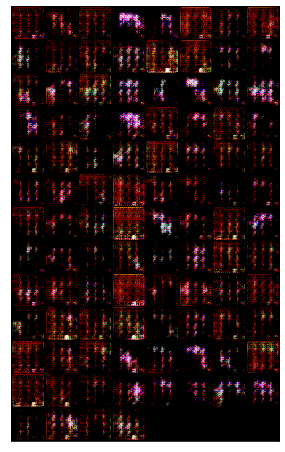

11 1 26 1.3737690448760986 1.7258305549621582
11 2 26 1.219604730606079 1.7687019109725952
11 3 26 1.2688838243484497 1.080701470375061
11 4 26 1.3070429563522339 2.2747600078582764
11 5 26 1.1920928955078125 0.9497895836830139
11 6 26 1.2654893398284912 2.5358333587646484
11 7 26 0.9691385626792908 1.8079562187194824
11 8 26 0.7594524621963501 2.0417423248291016
11 9 26 0.7837464809417725 1.9928224086761475
11 10 26 0.8049811720848083 1.800711989402771
11 11 26 1.0727307796478271 1.7798829078674316
11 12 26 1.1245920658111572 1.5477579832077026
11 13 26 1.4332966804504395 1.2975410223007202
11 14 26 1.188779592514038 2.097280979156494
11 15 26 1.1417025327682495 1.512453317642212
11 16 26 1.011208415031433 1.8553717136383057
11 17 26 0.9505621194839478 1.8694442510604858
11 18 26 0.8754239678382874 2.117720127105713
11 19 26 0.9766278266906738 1.4866787195205688
11 20 26 1.2207825183868408 1.938035011291504
11 21 26 1.313501000404358 1.0070065259933472
11 22 26 1.268180251121521 1.861

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11 26 26 0.7539808750152588 1.6777362823486328
Epoch: 11, D_Loss: 0.7539808750152588, G_Loss: 1.6777362823486328
(3, 860, 530)


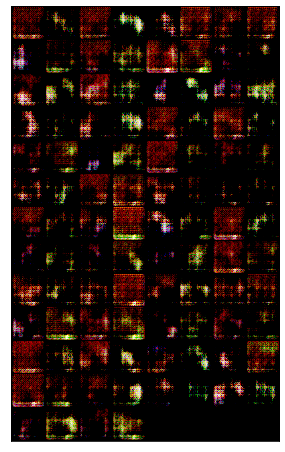

12 1 26 0.9470477104187012 1.8994804620742798
12 2 26 0.9911645650863647 1.109618902206421
12 3 26 1.1076393127441406 1.7924505472183228
12 4 26 1.0046063661575317 1.557858943939209
12 5 26 0.8925232887268066 1.3157000541687012
12 6 26 0.9629247784614563 1.8292535543441772
12 7 26 0.9591621160507202 1.2047553062438965
12 8 26 0.9605230093002319 1.9453288316726685
12 9 26 0.9514052867889404 1.3027005195617676
12 10 26 1.0267785787582397 1.7533718347549438
12 11 26 0.9555456638336182 1.328461766242981
12 12 26 0.9857397079467773 2.012935161590576
12 13 26 0.9980157613754272 1.314157247543335
12 14 26 0.983076810836792 2.2577831745147705
12 15 26 0.9058966636657715 1.7762075662612915
12 16 26 0.7933921813964844 1.6600406169891357
12 17 26 0.9597307443618774 2.1995456218719482
12 18 26 0.9468038082122803 1.7630099058151245
12 19 26 0.9364343881607056 1.6228141784667969
12 20 26 1.1142551898956299 1.9309251308441162
12 21 26 0.9786611795425415 1.73112154006958
12 22 26 1.1155891418457031 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12 26 26 1.2218201160430908 2.7187225818634033
Epoch: 12, D_Loss: 1.2218201160430908, G_Loss: 2.7187225818634033
(3, 860, 530)


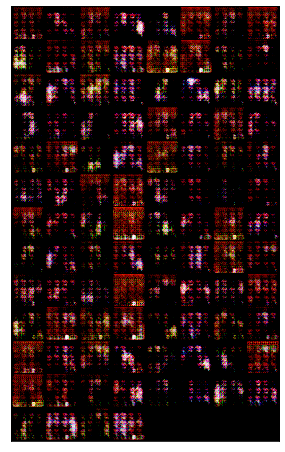

13 1 26 0.9188694953918457 1.5858672857284546
13 2 26 1.1168808937072754 1.8558146953582764
13 3 26 0.9674592614173889 1.8837696313858032
13 4 26 1.1269241571426392 1.241818904876709
13 5 26 1.2128255367279053 1.8639194965362549
13 6 26 1.3323054313659668 1.4061436653137207
13 7 26 1.1733068227767944 1.823042631149292
13 8 26 0.958114504814148 1.6992710828781128
13 9 26 1.0937645435333252 1.807104468345642
13 10 26 0.8700445890426636 1.4462954998016357
13 11 26 1.118452548980713 1.763511300086975
13 12 26 1.1408512592315674 1.3857028484344482
13 13 26 0.8652679920196533 1.5496621131896973
13 14 26 0.9275572299957275 2.195566177368164
13 15 26 1.1109071969985962 0.7638470530509949
13 16 26 1.1627213954925537 2.3373219966888428
13 17 26 0.9712974429130554 1.3752902746200562
13 18 26 0.9025821089744568 1.5260242223739624
13 19 26 0.9290335774421692 1.7087887525558472
13 20 26 0.9261789917945862 1.4283753633499146
13 21 26 1.0512402057647705 1.2696030139923096
13 22 26 1.0575573444366455 2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13 26 26 0.6430433988571167 1.96698796749115
Epoch: 13, D_Loss: 0.6430433988571167, G_Loss: 1.96698796749115
(3, 860, 530)


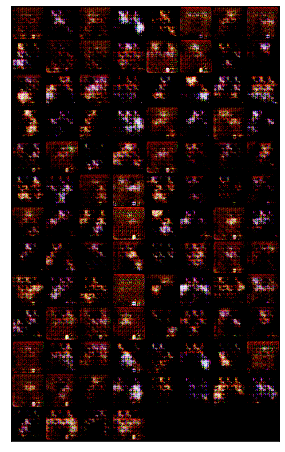

14 1 26 0.9464473724365234 2.2782633304595947
14 2 26 1.0147342681884766 1.524965524673462
14 3 26 1.1275736093521118 1.9496641159057617
14 4 26 1.2996811866760254 1.236665964126587
14 5 26 1.2474291324615479 1.9273146390914917
14 6 26 1.1574530601501465 1.1771806478500366
14 7 26 1.145195722579956 2.9286410808563232
14 8 26 1.3678593635559082 1.0681309700012207
14 9 26 1.472287654876709 2.1604995727539062
14 10 26 1.1664341688156128 1.4290952682495117
14 11 26 1.1456882953643799 2.254573106765747
14 12 26 1.0430890321731567 1.301930546760559
14 13 26 1.0314700603485107 2.7379817962646484
14 14 26 0.9838159084320068 1.3667875528335571
14 15 26 1.0471596717834473 2.5785155296325684
14 16 26 1.1495214700698853 1.1687898635864258
14 17 26 1.023379921913147 2.0629677772521973
14 18 26 1.1491641998291016 1.9224848747253418
14 19 26 1.0194417238235474 1.3239957094192505
14 20 26 1.1510255336761475 2.3182709217071533
14 21 26 1.1127514839172363 1.172575831413269
14 22 26 1.0025568008422852 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14 26 26 1.0474072694778442 1.5328879356384277
Epoch: 14, D_Loss: 1.0474072694778442, G_Loss: 1.5328879356384277
(3, 860, 530)


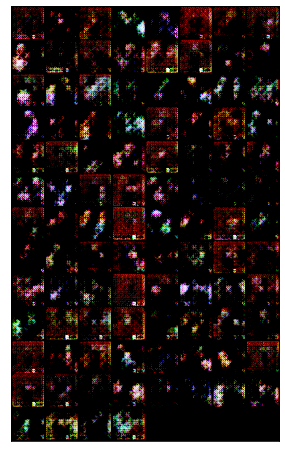

15 1 26 1.0754520893096924 1.3132126331329346
15 2 26 1.1740210056304932 1.5405137538909912
15 3 26 1.2076789140701294 1.2330013513565063
15 4 26 1.006127119064331 2.131706953048706
15 5 26 1.157043218612671 1.0540827512741089
15 6 26 1.0042372941970825 2.4283525943756104
15 7 26 1.0061208009719849 1.6728622913360596
15 8 26 1.082876443862915 1.4476503133773804
15 9 26 1.1058435440063477 1.9939936399459839
15 10 26 1.254653811454773 1.052289605140686
15 11 26 1.2450683116912842 2.231151819229126
15 12 26 1.111473560333252 1.3141412734985352
15 13 26 1.1130201816558838 2.7127130031585693
15 14 26 0.8786096572875977 2.0784049034118652
15 15 26 1.1587021350860596 1.5784400701522827
15 16 26 1.274836540222168 2.7707901000976562
15 17 26 1.4937493801116943 1.045885443687439
15 18 26 1.4052296876907349 2.3911733627319336
15 19 26 1.3011778593063354 1.837980031967163
15 20 26 1.353700876235962 1.7780147790908813
15 21 26 1.2144584655761719 2.3909473419189453
15 22 26 0.9534012675285339 2.4744

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


15 26 26 1.4035871028900146 2.3418567180633545
Epoch: 15, D_Loss: 1.4035871028900146, G_Loss: 2.3418567180633545
(3, 860, 530)


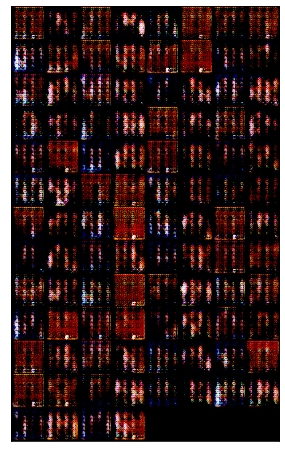

16 1 26 1.2839267253875732 1.6658633947372437
16 2 26 1.1032660007476807 1.9488532543182373
16 3 26 1.1473331451416016 2.7834482192993164
16 4 26 0.8490131497383118 1.8773118257522583
16 5 26 1.0566625595092773 2.1461586952209473
16 6 26 1.1614665985107422 2.501943588256836
16 7 26 1.4598275423049927 1.2240535020828247
16 8 26 1.592545747756958 1.8878343105316162
16 9 26 1.2926234006881714 1.756597876548767
16 10 26 1.448554515838623 1.3628147840499878
16 11 26 1.2172292470932007 2.1672983169555664
16 12 26 1.2082388401031494 1.5253360271453857
16 13 26 0.9647047519683838 2.0617926120758057
16 14 26 0.9227321147918701 1.995247483253479
16 15 26 0.9210454225540161 1.7541123628616333
16 16 26 1.017469048500061 2.1818296909332275
16 17 26 1.0658385753631592 1.2436776161193848
16 18 26 1.0935808420181274 2.3836708068847656
16 19 26 1.1184509992599487 1.4006825685501099
16 20 26 1.2467010021209717 1.761420726776123
16 21 26 1.204488754272461 1.3440485000610352
16 22 26 1.1432474851608276 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


16 26 26 1.0832608938217163 2.6444473266601562
Epoch: 16, D_Loss: 1.0832608938217163, G_Loss: 2.6444473266601562
(3, 860, 530)


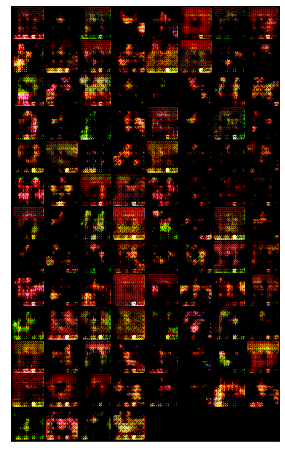

17 1 26 1.1232800483703613 1.0327168703079224
17 2 26 1.2832543849945068 2.5918796062469482
17 3 26 1.218354344367981 1.6182670593261719
17 4 26 1.380980134010315 1.8199241161346436
17 5 26 1.402649998664856 1.7499871253967285
17 6 26 1.3957041501998901 1.2375568151474
17 7 26 1.1176652908325195 2.268733263015747
17 8 26 0.8120834827423096 1.9567670822143555
17 9 26 0.5763627290725708 2.022911787033081
17 10 26 0.672443687915802 2.333580732345581
17 11 26 0.612175703048706 2.2086074352264404
17 12 26 0.7143899202346802 2.1131703853607178
17 13 26 0.9229588508605957 2.1287639141082764
17 14 26 1.2338155508041382 2.033411979675293
17 15 26 1.4665765762329102 1.9363137483596802
17 16 26 1.2042267322540283 1.9629669189453125
17 17 26 1.4267836809158325 2.114436388015747
17 18 26 1.3330206871032715 2.2058799266815186
17 19 26 1.1065700054168701 2.6134026050567627
17 20 26 0.6990610957145691 2.663632869720459
17 21 26 0.6443472504615784 2.8737707138061523
17 22 26 0.9303075075149536 2.661682

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


17 26 26 1.4960952997207642 0.8145100474357605
Epoch: 17, D_Loss: 1.4960952997207642, G_Loss: 0.8145100474357605
(3, 860, 530)


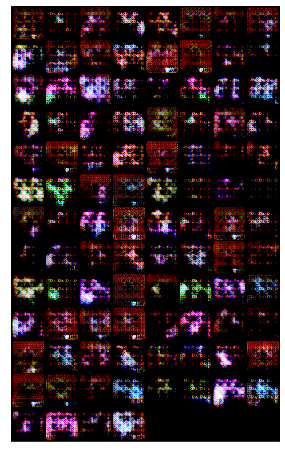

18 1 26 1.175920844078064 2.4820327758789062
18 2 26 0.7593975067138672 2.4266550540924072
18 3 26 0.6624207496643066 1.9336222410202026
18 4 26 0.8798476457595825 2.0369527339935303
18 5 26 1.1634012460708618 1.6511743068695068
18 6 26 1.1000771522521973 1.8758267164230347
18 7 26 1.2086851596832275 1.0476750135421753
18 8 26 1.2962584495544434 2.6389801502227783
18 9 26 1.213439702987671 1.060417652130127
18 10 26 1.1644330024719238 1.9984731674194336
18 11 26 1.1199963092803955 1.5082075595855713
18 12 26 0.9244145154953003 1.5096782445907593
18 13 26 0.9256472587585449 1.5585421323776245
18 14 26 0.8867278099060059 1.524781346321106
18 15 26 0.7881185412406921 1.9071438312530518
18 16 26 0.8414719104766846 1.6201242208480835
18 17 26 1.0399423837661743 1.2357231378555298
18 18 26 0.9991761445999146 2.070960760116577
18 19 26 1.1202704906463623 1.4555317163467407
18 20 26 1.077863335609436 1.6757785081863403
18 21 26 0.9893636703491211 1.7431745529174805
18 22 26 0.8451191186904907 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


18 26 26 1.059706211090088 1.4903907775878906
Epoch: 18, D_Loss: 1.059706211090088, G_Loss: 1.4903907775878906
(3, 860, 530)


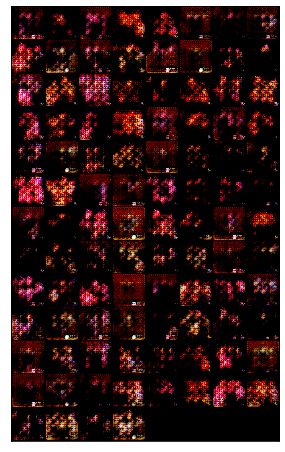

19 1 26 1.1184659004211426 1.3147317171096802
19 2 26 1.0393697023391724 1.8313019275665283
19 3 26 1.0845781564712524 1.5007778406143188
19 4 26 1.0051493644714355 1.6113624572753906
19 5 26 0.9544364213943481 1.540225625038147
19 6 26 0.9627405405044556 1.9823293685913086
19 7 26 1.039862036705017 1.3882582187652588
19 8 26 1.0656745433807373 1.759800910949707
19 9 26 1.0779361724853516 1.660094141960144
19 10 26 1.1615557670593262 1.8662551641464233
19 11 26 1.3014391660690308 0.892708420753479
19 12 26 1.3054211139678955 2.0704474449157715
19 13 26 0.9408642053604126 2.1446421146392822
19 14 26 0.9161895513534546 1.6321039199829102
19 15 26 1.0151500701904297 1.8530497550964355
19 16 26 0.8537152409553528 2.217170238494873
19 17 26 1.015843152999878 1.6588325500488281
19 18 26 1.2479147911071777 1.3725974559783936
19 19 26 1.0916006565093994 2.5906832218170166
19 20 26 1.026627779006958 1.6940727233886719
19 21 26 1.231716513633728 1.550418734550476
19 22 26 1.304738998413086 1.872

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


19 26 26 1.0175831317901611 1.8751686811447144
Epoch: 19, D_Loss: 1.0175831317901611, G_Loss: 1.8751686811447144
(3, 860, 530)


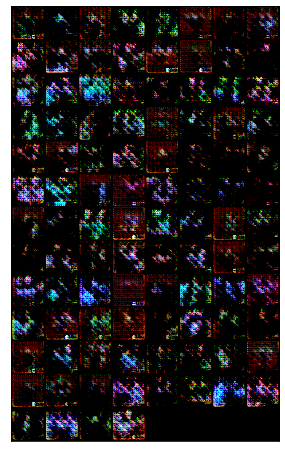

20 1 26 1.0333706140518188 2.127725601196289
20 2 26 1.1253013610839844 1.472356915473938
20 3 26 1.3250374794006348 2.223294258117676
20 4 26 1.1140114068984985 1.775046706199646
20 5 26 1.138169288635254 1.7847217321395874
20 6 26 1.2066972255706787 2.0173654556274414
20 7 26 1.2194366455078125 2.2496111392974854
20 8 26 1.4509021043777466 1.6478466987609863
20 9 26 1.2428452968597412 1.8496283292770386
20 10 26 1.436031699180603 1.9318609237670898
20 11 26 0.9121154546737671 2.3216371536254883
20 12 26 1.005953073501587 2.1843478679656982
20 13 26 1.06236732006073 2.3241469860076904
20 14 26 1.0631158351898193 1.9236304759979248
20 15 26 1.3871638774871826 2.512143611907959
20 16 26 1.3772790431976318 1.0932446718215942
20 17 26 1.619706630706787 2.139411211013794
20 18 26 1.0697433948516846 2.536276340484619
20 19 26 1.1236188411712646 1.7426109313964844
20 20 26 1.1160075664520264 2.0392470359802246
20 21 26 1.0800809860229492 1.8884680271148682
20 22 26 1.1210439205169678 1.78644

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


20 26 26 1.3185176849365234 1.9472005367279053
Epoch: 20, D_Loss: 1.3185176849365234, G_Loss: 1.9472005367279053
(3, 860, 530)


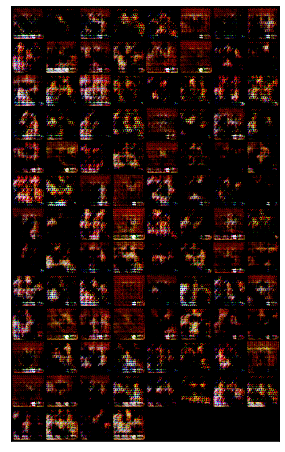

21 1 26 1.0304075479507446 2.154010772705078
21 2 26 1.1426771879196167 0.9714863300323486
21 3 26 1.2739815711975098 1.9700263738632202
21 4 26 1.0878407955169678 1.6325578689575195
21 5 26 1.0058059692382812 1.4675817489624023
21 6 26 1.0990318059921265 1.6161526441574097
21 7 26 1.0885155200958252 1.4652916193008423
21 8 26 1.2700703144073486 1.4904476404190063
21 9 26 1.1567269563674927 1.7224992513656616
21 10 26 1.1825501918792725 1.497128963470459
21 11 26 1.3930110931396484 1.2620335817337036
21 12 26 1.2528560161590576 1.6357684135437012
21 13 26 0.933279275894165 1.6928404569625854
21 14 26 0.9887547492980957 1.7624017000198364
21 15 26 1.0456193685531616 1.66880464553833
21 16 26 1.2103086709976196 1.2564584016799927
21 17 26 1.0792957544326782 1.5537949800491333
21 18 26 0.9872461557388306 1.9220315217971802
21 19 26 0.870335578918457 1.8607598543167114
21 20 26 0.9683985710144043 1.6948647499084473
21 21 26 1.0656381845474243 1.6758694648742676
21 22 26 1.0842092037200928 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


21 26 26 0.9856940507888794 2.1483898162841797
Epoch: 21, D_Loss: 0.9856940507888794, G_Loss: 2.1483898162841797
(3, 860, 530)


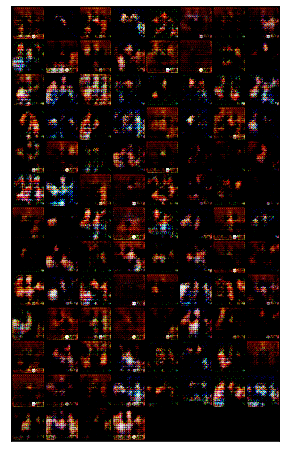

22 1 26 1.0358445644378662 1.4268261194229126
22 2 26 0.7662800550460815 1.8233028650283813
22 3 26 0.8711826801300049 1.8939121961593628
22 4 26 1.2411117553710938 1.1876403093338013
22 5 26 1.074816346168518 1.9946006536483765
22 6 26 1.2346431016921997 1.2998768091201782
22 7 26 1.035923957824707 1.887534737586975
22 8 26 0.8351576328277588 2.0400750637054443
22 9 26 0.851751446723938 1.6205894947052002
22 10 26 1.1282973289489746 1.5475894212722778
22 11 26 1.0081441402435303 1.8513174057006836
22 12 26 1.1215054988861084 1.9329932928085327
22 13 26 1.2896744012832642 1.1010985374450684
22 14 26 1.2462915182113647 1.9375030994415283
22 15 26 1.204106330871582 1.7140841484069824
22 16 26 1.2268850803375244 1.7328730821609497
22 17 26 1.0724873542785645 1.8941646814346313
22 18 26 0.9576249122619629 1.9096968173980713
22 19 26 1.0097179412841797 2.2676525115966797
22 20 26 1.1373127698898315 1.186206579208374
22 21 26 1.3752741813659668 2.2643375396728516
22 22 26 1.2975611686706543 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


22 26 26 1.0773820877075195 1.715786337852478
Epoch: 22, D_Loss: 1.0773820877075195, G_Loss: 1.715786337852478
(3, 860, 530)


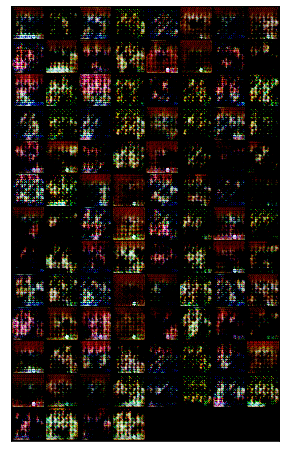

23 1 26 1.0187010765075684 2.848129987716675
23 2 26 1.1552497148513794 0.8807075619697571
23 3 26 1.2129778861999512 2.6387217044830322
23 4 26 0.9443457126617432 1.79036545753479
23 5 26 1.0324647426605225 1.6668652296066284
23 6 26 1.2523634433746338 2.449889898300171
23 7 26 1.0451844930648804 1.5847543478012085
23 8 26 0.9654803276062012 2.2716691493988037
23 9 26 0.9600390195846558 1.6960198879241943
23 10 26 0.9971433877944946 1.9025245904922485
23 11 26 1.075610876083374 1.6094242334365845
23 12 26 1.2170907258987427 2.0893774032592773
23 13 26 1.2735552787780762 1.0958999395370483
23 14 26 1.2583061456680298 1.973875880241394
23 15 26 1.2444688081741333 1.5525285005569458
23 16 26 1.0424389839172363 1.9818120002746582
23 17 26 1.1814051866531372 1.5528830289840698
23 18 26 1.3168847560882568 1.5757474899291992
23 19 26 1.0331165790557861 2.1421384811401367
23 20 26 1.057511806488037 1.3198868036270142
23 21 26 1.1081058979034424 2.141787528991699
23 22 26 0.9293575882911682 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


23 26 26 1.3038932085037231 1.5824556350708008
Epoch: 23, D_Loss: 1.3038932085037231, G_Loss: 1.5824556350708008
(3, 860, 530)


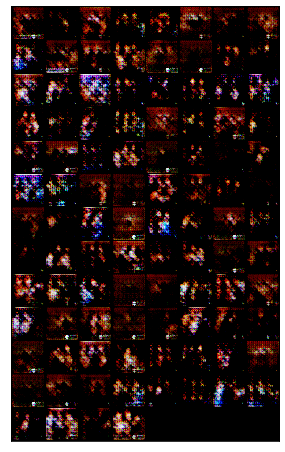

24 1 26 1.1357710361480713 1.0479518175125122
24 2 26 1.162339448928833 1.68747878074646
24 3 26 1.1234188079833984 1.3950058221817017
24 4 26 1.1708343029022217 1.2802441120147705
24 5 26 1.2060747146606445 1.9921520948410034
24 6 26 1.3639564514160156 1.0968358516693115
24 7 26 1.2127201557159424 1.5064183473587036
24 8 26 1.045623540878296 1.8617637157440186
24 9 26 1.2016029357910156 0.8396535515785217
24 10 26 1.27476167678833 2.0767767429351807
24 11 26 1.0328222513198853 1.8931324481964111
24 12 26 1.133294701576233 1.1754390001296997
24 13 26 1.1671478748321533 1.6720473766326904
24 14 26 1.2460033893585205 1.4462794065475464
24 15 26 1.3423199653625488 1.4560977220535278
24 16 26 1.2582507133483887 1.4005563259124756
24 17 26 1.075348138809204 2.0407450199127197
24 18 26 1.0357738733291626 1.366349220275879
24 19 26 1.0223889350891113 2.0075387954711914
24 20 26 1.1960957050323486 1.1960489749908447
24 21 26 1.20751953125 1.677419900894165
24 22 26 1.0703011751174927 1.4614927

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


24 26 26 1.0651414394378662 1.6847378015518188
Epoch: 24, D_Loss: 1.0651414394378662, G_Loss: 1.6847378015518188
(3, 860, 530)


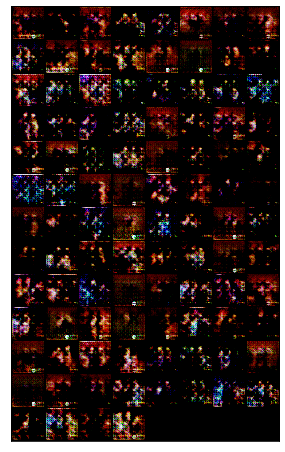

25 1 26 1.1074399948120117 1.0850460529327393
25 2 26 1.086326241493225 1.7894141674041748
25 3 26 1.0337175130844116 1.8183631896972656
25 4 26 1.0043745040893555 1.3992853164672852
25 5 26 1.1561843156814575 1.5534453392028809
25 6 26 1.0856822729110718 1.576574444770813
25 7 26 1.019964575767517 1.5958935022354126
25 8 26 1.004763126373291 1.3865963220596313
25 9 26 0.9881515502929688 2.0737709999084473
25 10 26 1.0069984197616577 1.0067716836929321
25 11 26 1.109836459159851 2.0645294189453125
25 12 26 1.0260661840438843 1.4903044700622559
25 13 26 1.263960361480713 1.0830800533294678
25 14 26 1.18930184841156 1.9023425579071045
25 15 26 1.3840916156768799 0.9123156666755676
25 16 26 1.2783490419387817 1.9441946744918823
25 17 26 1.294602632522583 1.0726995468139648
25 18 26 1.1489439010620117 1.7267206907272339
25 19 26 1.1040929555892944 1.424378514289856
25 20 26 1.1195392608642578 1.2895539999008179
25 21 26 0.9551326632499695 1.8683923482894897
25 22 26 1.3388044834136963 0.93

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


25 26 26 1.1427940130233765 2.866652488708496
Epoch: 25, D_Loss: 1.1427940130233765, G_Loss: 2.866652488708496
(3, 860, 530)


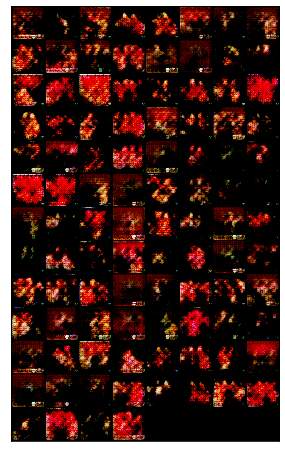

26 1 26 1.2794630527496338 0.6661317348480225
26 2 26 1.3766082525253296 2.2959868907928467
26 3 26 1.0395166873931885 1.785438895225525
26 4 26 1.1034053564071655 1.4198582172393799
26 5 26 1.385542869567871 1.5504974126815796
26 6 26 1.40510892868042 1.3401498794555664
26 7 26 1.3908554315567017 1.5153825283050537
26 8 26 1.1531816720962524 1.6840664148330688
26 9 26 1.0980092287063599 1.7070748805999756
26 10 26 1.2895785570144653 1.2510913610458374
26 11 26 1.196808934211731 1.5180740356445312
26 12 26 1.3373596668243408 1.454117774963379
26 13 26 1.2099456787109375 1.7079719305038452
26 14 26 1.196171522140503 1.398535966873169
26 15 26 1.28498375415802 1.5332231521606445
26 16 26 1.337424874305725 1.7131303548812866
26 17 26 1.3430805206298828 1.3346694707870483
26 18 26 1.1677727699279785 1.5267099142074585
26 19 26 1.1760916709899902 1.7380762100219727
26 20 26 1.1868740320205688 1.44606614112854
26 21 26 1.162672519683838 1.432780146598816
26 22 26 1.2802516222000122 1.5729790

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


26 26 26 1.165761947631836 1.3453222513198853
Epoch: 26, D_Loss: 1.165761947631836, G_Loss: 1.3453222513198853
(3, 860, 530)


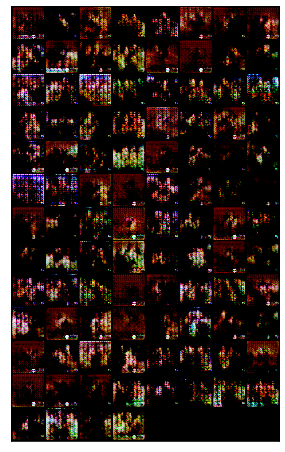

27 1 26 1.1030060052871704 1.8148704767227173
27 2 26 1.0543427467346191 1.5565840005874634
27 3 26 1.0937256813049316 1.4943783283233643
27 4 26 1.2987860441207886 1.2912596464157104
27 5 26 1.0905526876449585 1.564260721206665
27 6 26 1.1448686122894287 1.553095817565918
27 7 26 1.3459751605987549 1.0078401565551758
27 8 26 1.4144617319107056 1.6016693115234375
27 9 26 1.1508331298828125 1.6124026775360107
27 10 26 1.2155364751815796 1.1770623922348022
27 11 26 1.1296374797821045 1.7555792331695557
27 12 26 0.9440501928329468 1.9939346313476562
27 13 26 1.0194158554077148 1.4796756505966187
27 14 26 1.163339614868164 1.3768848180770874
27 15 26 1.2224427461624146 1.7507050037384033
27 16 26 1.2336492538452148 1.484809398651123
27 17 26 1.2170027494430542 1.5619179010391235
27 18 26 1.270677089691162 1.7107852697372437
27 19 26 1.3281147480010986 1.4362692832946777
27 20 26 1.4592300653457642 1.5492552518844604
27 21 26 1.166152000427246 1.9979153871536255
27 22 26 1.1073596477508545 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


27 26 26 1.1397881507873535 1.5767346620559692
Epoch: 27, D_Loss: 1.1397881507873535, G_Loss: 1.5767346620559692
(3, 860, 530)


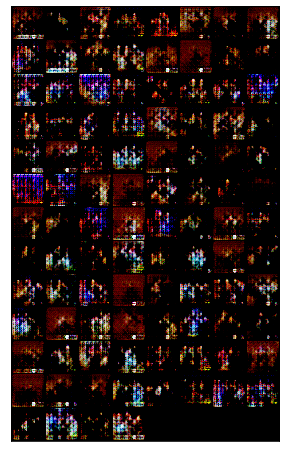

28 1 26 1.0235131978988647 2.285844326019287
28 2 26 1.4180569648742676 0.4933193325996399
28 3 26 1.618683099746704 2.004627227783203
28 4 26 1.0691746473312378 2.173239231109619
28 5 26 1.405929446220398 1.0586729049682617
28 6 26 1.4944968223571777 1.1551613807678223
28 7 26 1.3256239891052246 1.5795434713363647
28 8 26 1.3324594497680664 1.4664844274520874
28 9 26 1.4056217670440674 1.1732864379882812
28 10 26 1.2797229290008545 1.376887559890747
28 11 26 1.3323390483856201 1.5291705131530762
28 12 26 1.0872429609298706 1.8071194887161255
28 13 26 1.0470621585845947 1.3747985363006592
28 14 26 1.0697208642959595 1.7401410341262817
28 15 26 0.9408481121063232 1.8305716514587402
28 16 26 0.9655068516731262 1.44316828250885
28 17 26 1.1565282344818115 1.7584123611450195
28 18 26 1.3728325366973877 1.1957390308380127
28 19 26 1.2445003986358643 1.5744845867156982
28 20 26 1.1500890254974365 1.7467989921569824
28 21 26 1.1123279333114624 1.277883768081665
28 22 26 1.0378202199935913 1.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


28 26 26 1.0475932359695435 1.682975172996521
Epoch: 28, D_Loss: 1.0475932359695435, G_Loss: 1.682975172996521
(3, 860, 530)


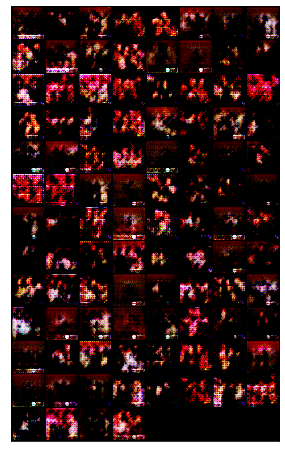

29 1 26 0.9518582820892334 1.7762492895126343
29 2 26 1.0254745483398438 1.4211773872375488
29 3 26 1.0057510137557983 1.452880859375
29 4 26 1.0365291833877563 1.668340802192688
29 5 26 0.9808565974235535 1.4512406587600708
29 6 26 1.1127792596817017 1.5813935995101929
29 7 26 1.159186601638794 1.4978320598602295
29 8 26 1.377124547958374 1.0626156330108643
29 9 26 1.091490626335144 1.739315152168274
29 10 26 1.0778123140335083 1.2648611068725586
29 11 26 1.0569541454315186 1.8147014379501343
29 12 26 1.3815184831619263 1.1637489795684814
29 13 26 1.2580695152282715 1.1698278188705444
29 14 26 1.215172290802002 1.5505456924438477
29 15 26 0.977388858795166 1.6171996593475342
29 16 26 0.9638886451721191 1.6496402025222778
29 17 26 1.098004698753357 1.2936629056930542
29 18 26 1.1037006378173828 1.432017207145691
29 19 26 1.0832715034484863 1.5458955764770508
29 20 26 0.9909948110580444 1.4263213872909546
29 21 26 1.1672217845916748 1.2761521339416504
29 22 26 1.150949239730835 1.453684

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


29 26 26 1.302781105041504 1.5067298412322998
Epoch: 29, D_Loss: 1.302781105041504, G_Loss: 1.5067298412322998
(3, 860, 530)


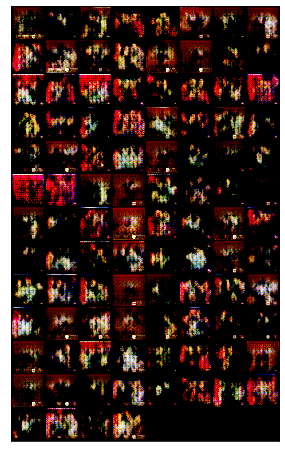

30 1 26 1.1499173641204834 1.3958309888839722
30 2 26 1.0280053615570068 1.604804277420044
30 3 26 0.9468279480934143 1.5925058126449585
30 4 26 0.9863053560256958 1.5144964456558228
30 5 26 1.0073938369750977 2.0273571014404297
30 6 26 1.1834559440612793 0.9801416993141174
30 7 26 1.3413358926773071 1.874729037284851
30 8 26 1.2340843677520752 1.3384864330291748
30 9 26 1.1806387901306152 1.4436661005020142
30 10 26 1.0957757234573364 1.7552003860473633
30 11 26 1.1649688482284546 1.4432164430618286
30 12 26 1.1204818487167358 1.68562650680542
30 13 26 1.2476096153259277 1.2854738235473633
30 14 26 1.2038254737854004 1.6361265182495117
30 15 26 1.24908447265625 1.0305618047714233
30 16 26 1.2147315740585327 1.8812512159347534
30 17 26 0.8409122228622437 2.0669407844543457
30 18 26 1.1539597511291504 1.175290584564209
30 19 26 1.1443760395050049 1.6827287673950195
30 20 26 0.9878345727920532 1.9804936647415161
30 21 26 1.0936110019683838 1.270730972290039
30 22 26 1.1039278507232666 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


30 26 26 1.1146299839019775 1.6696199178695679
Epoch: 30, D_Loss: 1.1146299839019775, G_Loss: 1.6696199178695679
(3, 860, 530)


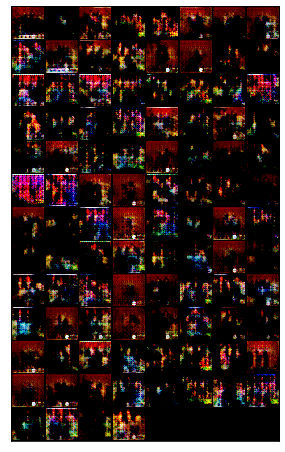

31 1 26 1.1414175033569336 1.4308868646621704
31 2 26 0.9832019805908203 1.4862476587295532
31 3 26 1.1198104619979858 1.6941677331924438
31 4 26 1.1188535690307617 1.4010788202285767
31 5 26 1.218060851097107 1.1799241304397583
31 6 26 1.3128777742385864 1.4004548788070679
31 7 26 1.2409398555755615 0.9785667657852173
31 8 26 1.3531286716461182 1.4676802158355713
31 9 26 1.184944987297058 1.307125449180603
31 10 26 1.1149944067001343 1.172958493232727
31 11 26 1.0181787014007568 1.6611378192901611
31 12 26 1.2035819292068481 1.3659820556640625
31 13 26 1.1435236930847168 1.3369200229644775
31 14 26 1.3335309028625488 1.291575312614441
31 15 26 1.4234857559204102 1.122962236404419
31 16 26 1.1661899089813232 1.3022772073745728
31 17 26 1.1290557384490967 1.4746806621551514
31 18 26 1.1200602054595947 1.6297268867492676
31 19 26 1.2101414203643799 1.0910886526107788
31 20 26 1.0202561616897583 1.7346948385238647
31 21 26 1.2510221004486084 1.146325707435608
31 22 26 1.188607931137085 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


31 26 26 1.1331617832183838 1.2842881679534912
Epoch: 31, D_Loss: 1.1331617832183838, G_Loss: 1.2842881679534912
(3, 860, 530)


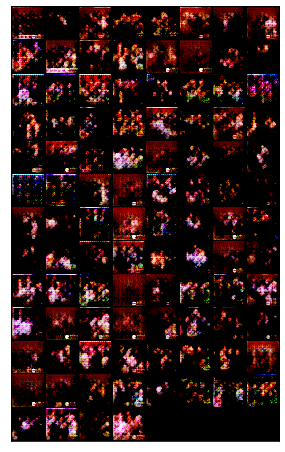

32 1 26 1.0186564922332764 1.541581153869629
32 2 26 1.100067377090454 1.3946338891983032
32 3 26 1.1343989372253418 1.3333505392074585
32 4 26 1.1804625988006592 1.303322434425354
32 5 26 1.1363894939422607 1.3657236099243164
32 6 26 1.1916930675506592 1.249686598777771
32 7 26 1.1720410585403442 1.3029769659042358
32 8 26 1.1373956203460693 1.367730975151062
32 9 26 1.155472755432129 1.3352278470993042
32 10 26 1.0932235717773438 1.6364201307296753
32 11 26 1.196540355682373 1.1448642015457153
32 12 26 1.2779172658920288 1.552778959274292
32 13 26 1.234847068786621 1.2838222980499268
32 14 26 1.2392406463623047 1.681463599205017
32 15 26 1.1610199213027954 1.4503196477890015
32 16 26 1.1537340879440308 1.3700003623962402
32 17 26 1.2544234991073608 1.6769561767578125
32 18 26 1.2021617889404297 1.1086745262145996
32 19 26 1.255763053894043 1.7069436311721802
32 20 26 1.1665548086166382 1.5853893756866455
32 21 26 1.106891393661499 1.3182607889175415
32 22 26 1.2018303871154785 1.3867

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


32 26 26 1.0956549644470215 1.0839585065841675
Epoch: 32, D_Loss: 1.0956549644470215, G_Loss: 1.0839585065841675
(3, 860, 530)


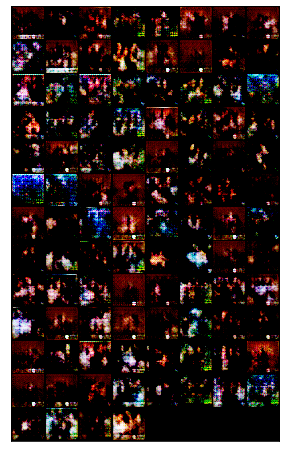

33 1 26 1.0788365602493286 1.6430927515029907
33 2 26 1.0553563833236694 1.3294460773468018
33 3 26 1.1339852809906006 1.2115864753723145
33 4 26 1.1047879457473755 1.424254298210144
33 5 26 1.2760719060897827 1.3814777135849
33 6 26 1.3806098699569702 1.0371028184890747
33 7 26 1.2836289405822754 1.2671966552734375
33 8 26 1.1214957237243652 1.4477211236953735
33 9 26 1.0463120937347412 1.6411410570144653
33 10 26 1.0722509622573853 1.3930974006652832
33 11 26 1.0906124114990234 1.3170578479766846
33 12 26 1.0789949893951416 1.4638437032699585
33 13 26 1.1291850805282593 1.1445392370224
33 14 26 1.1786580085754395 1.684450387954712
33 15 26 1.2408192157745361 0.7651982307434082
33 16 26 1.329526662826538 1.7758747339248657
33 17 26 1.0151512622833252 1.306239366531372
33 18 26 1.0656228065490723 1.2316559553146362
33 19 26 0.9952022433280945 1.5405253171920776
33 20 26 1.0991437435150146 1.146079659461975
33 21 26 1.2732598781585693 1.3075894117355347
33 22 26 1.3187936544418335 1.028

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


33 26 26 1.067228078842163 1.4357309341430664
Epoch: 33, D_Loss: 1.067228078842163, G_Loss: 1.4357309341430664
(3, 860, 530)


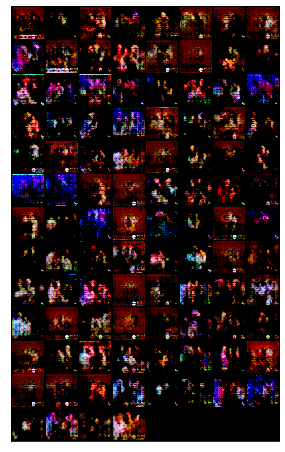

34 1 26 1.0491869449615479 1.5640279054641724
34 2 26 1.15208899974823 0.8450378179550171
34 3 26 1.1599711179733276 1.6624383926391602
34 4 26 1.0586540699005127 1.3932929039001465
34 5 26 1.130181074142456 1.028439998626709
34 6 26 1.2259800434112549 1.553613305091858
34 7 26 1.0854029655456543 1.5072388648986816
34 8 26 1.1457570791244507 1.1168605089187622
34 9 26 1.1881740093231201 1.3427367210388184
34 10 26 1.3181103467941284 1.1548786163330078
34 11 26 1.2708959579467773 1.175069808959961
34 12 26 1.2403651475906372 1.167686939239502
34 13 26 1.1722525358200073 1.5386430025100708
34 14 26 1.1516774892807007 1.1686029434204102
34 15 26 1.055948257446289 1.5347990989685059
34 16 26 1.2006361484527588 1.0194320678710938
34 17 26 1.1133177280426025 1.3956376314163208
34 18 26 1.2038767337799072 1.3991607427597046
34 19 26 1.247269630432129 1.04913330078125
34 20 26 1.2049565315246582 1.5512521266937256
34 21 26 1.2460038661956787 1.0810222625732422
34 22 26 1.2343337535858154 1.287

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


34 26 26 1.083884835243225 0.9645098447799683
Epoch: 34, D_Loss: 1.083884835243225, G_Loss: 0.9645098447799683
(3, 860, 530)


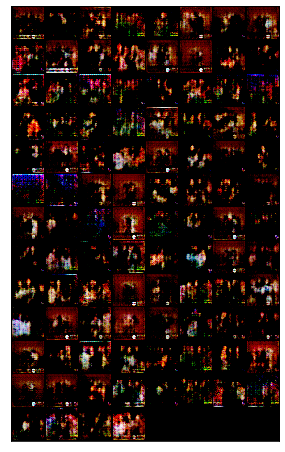

35 1 26 1.1183754205703735 1.6231069564819336
35 2 26 1.1273189783096313 1.2680139541625977
35 3 26 1.0976768732070923 1.3111845254898071
35 4 26 1.0923361778259277 1.3621423244476318
35 5 26 1.1268846988677979 1.0916900634765625
35 6 26 1.080641269683838 1.7232955694198608
35 7 26 1.1715114116668701 0.7791023254394531
35 8 26 1.308689832687378 1.4088939428329468
35 9 26 1.0361952781677246 1.7024948596954346
35 10 26 1.121190071105957 0.9729979038238525
35 11 26 1.3119429349899292 1.3662960529327393
35 12 26 1.299342393875122 1.1190661191940308
35 13 26 1.1810606718063354 1.1203430891036987
35 14 26 1.1486289501190186 1.48927640914917
35 15 26 1.053978443145752 1.3157974481582642
35 16 26 1.0260547399520874 1.40580415725708
35 17 26 1.071697473526001 1.647109031677246
35 18 26 1.1608660221099854 0.8986612558364868
35 19 26 1.3750122785568237 1.5796490907669067
35 20 26 1.2689995765686035 1.3111886978149414
35 21 26 1.1548393964767456 1.282727837562561
35 22 26 1.260521650314331 1.30389

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


35 26 26 1.0551631450653076 0.5595058798789978
Epoch: 35, D_Loss: 1.0551631450653076, G_Loss: 0.5595058798789978
(3, 860, 530)


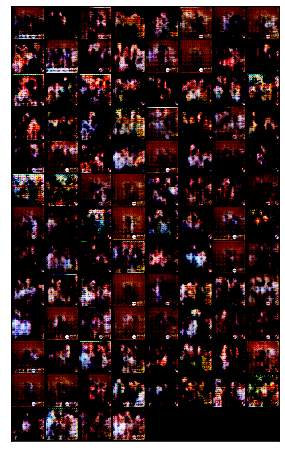

36 1 26 1.6056462526321411 1.7718110084533691
36 2 26 0.8435230255126953 2.321725368499756
36 3 26 1.1524686813354492 1.190677285194397
36 4 26 1.2696571350097656 1.3594392538070679
36 5 26 1.2858941555023193 1.625158429145813
36 6 26 1.0793898105621338 1.4493058919906616
36 7 26 1.1866176128387451 1.2560689449310303
36 8 26 1.1308372020721436 1.3517487049102783
36 9 26 1.1825286149978638 1.3050364255905151
36 10 26 1.2263566255569458 1.3211784362792969
36 11 26 1.0717675685882568 1.4751489162445068
36 12 26 1.1613976955413818 1.2935253381729126
36 13 26 1.1537196636199951 1.3469069004058838
36 14 26 1.1978806257247925 1.4000400304794312
36 15 26 1.0234525203704834 1.7123483419418335
36 16 26 1.2121086120605469 1.4339773654937744
36 17 26 1.2136348485946655 1.2064504623413086
36 18 26 1.2156689167022705 1.4604536294937134
36 19 26 1.2105262279510498 1.2519642114639282
36 20 26 1.3069255352020264 1.305232048034668
36 21 26 1.2533621788024902 1.101640224456787
36 22 26 1.3279414176940918

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


36 26 26 1.0678375959396362 2.012921094894409
Epoch: 36, D_Loss: 1.0678375959396362, G_Loss: 2.012921094894409
(3, 860, 530)


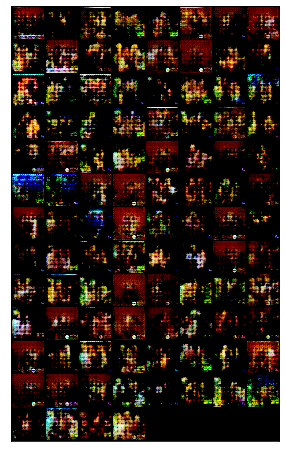

37 1 26 1.0464866161346436 1.2506537437438965
37 2 26 1.06837797164917 2.058236837387085
37 3 26 1.0640952587127686 1.1994694471359253
37 4 26 1.123539686203003 1.754196286201477
37 5 26 1.1882472038269043 1.4029884338378906
37 6 26 1.225731372833252 1.2418875694274902
37 7 26 1.1498866081237793 1.4278960227966309
37 8 26 1.1038234233856201 1.0715758800506592
37 9 26 1.1858696937561035 1.83296799659729
37 10 26 1.1139987707138062 1.0309953689575195
37 11 26 1.097529649734497 1.5428688526153564
37 12 26 1.212347388267517 1.4139010906219482
37 13 26 1.1444259881973267 1.4192304611206055
37 14 26 1.0940310955047607 1.3114073276519775
37 15 26 1.1038475036621094 1.559574842453003
37 16 26 1.0199781656265259 1.643954873085022
37 17 26 1.1075431108474731 1.0189450979232788
37 18 26 1.101637363433838 1.7623409032821655
37 19 26 1.090223789215088 1.3296066522598267
37 20 26 1.1998419761657715 1.2751476764678955
37 21 26 1.0299148559570312 1.5921090841293335
37 22 26 1.0719153881072998 1.441471

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


37 26 26 1.148498296737671 1.5654605627059937
Epoch: 37, D_Loss: 1.148498296737671, G_Loss: 1.5654605627059937
(3, 860, 530)


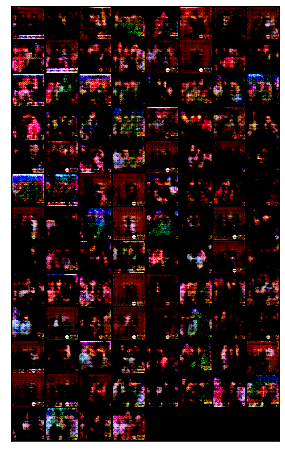

38 1 26 1.17503023147583 1.5461851358413696
38 2 26 1.0646944046020508 1.0585472583770752
38 3 26 1.146181344985962 1.743088960647583
38 4 26 1.0340280532836914 1.1705371141433716
38 5 26 1.0264778137207031 1.936781406402588
38 6 26 1.0715981721878052 1.0359711647033691
38 7 26 1.1701360940933228 1.756805419921875
38 8 26 1.0889378786087036 1.255613923072815
38 9 26 0.981681227684021 1.7743370532989502
38 10 26 1.024492621421814 1.3658719062805176
38 11 26 0.9419373273849487 1.3773623704910278
38 12 26 1.1176382303237915 1.7006345987319946
38 13 26 1.0561401844024658 1.3507723808288574
38 14 26 1.2894525527954102 1.458249807357788
38 15 26 1.159407615661621 1.74617600440979
38 16 26 1.2225332260131836 1.4182571172714233
38 17 26 1.2653207778930664 1.3264564275741577
38 18 26 1.3275392055511475 1.4637153148651123
38 19 26 0.9405949711799622 1.4396872520446777
38 20 26 0.944900393486023 1.8289735317230225
38 21 26 0.928763747215271 1.4151027202606201
38 22 26 0.9416974782943726 1.7439385

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


38 26 26 1.2291841506958008 1.899868369102478
Epoch: 38, D_Loss: 1.2291841506958008, G_Loss: 1.899868369102478
(3, 860, 530)


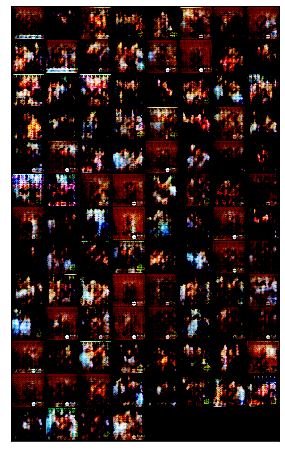

39 1 26 1.181917428970337 0.905965268611908
39 2 26 1.352148175239563 1.5972844362258911
39 3 26 1.1610829830169678 1.6496586799621582
39 4 26 1.145129919052124 1.1658912897109985
39 5 26 1.1060936450958252 1.6526970863342285
39 6 26 1.1716067790985107 1.6951088905334473
39 7 26 1.1868317127227783 1.1280537843704224
39 8 26 1.1945149898529053 1.8901196718215942
39 9 26 1.3268918991088867 0.8798139095306396
39 10 26 1.4075348377227783 1.5908291339874268
39 11 26 1.0522613525390625 1.85701322555542
39 12 26 1.3079266548156738 1.0671257972717285
39 13 26 1.3544549942016602 1.266507625579834
39 14 26 1.1863789558410645 1.6281384229660034
39 15 26 1.054864764213562 1.480005145072937
39 16 26 1.0660855770111084 1.4024080038070679
39 17 26 0.9879623055458069 2.1332592964172363
39 18 26 1.0410165786743164 1.0784530639648438
39 19 26 1.1170568466186523 1.8070052862167358
39 20 26 0.9952746629714966 1.7641198635101318
39 21 26 0.9875086545944214 1.455769658088684
39 22 26 1.047956109046936 1.591

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


39 26 26 0.9401242733001709 1.3481425046920776
Epoch: 39, D_Loss: 0.9401242733001709, G_Loss: 1.3481425046920776
(3, 860, 530)


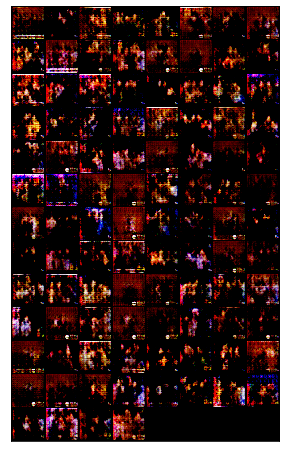

40 1 26 1.0194287300109863 1.8422437906265259
40 2 26 0.9994229078292847 1.7418371438980103
40 3 26 1.0919685363769531 1.039184808731079
40 4 26 1.3967657089233398 1.6665503978729248
40 5 26 1.3656105995178223 0.7523595690727234
40 6 26 1.3703148365020752 1.534379243850708
40 7 26 1.3455684185028076 1.3085914850234985
40 8 26 1.1371439695358276 1.228899598121643
40 9 26 1.0959131717681885 1.6249902248382568
40 10 26 1.0931726694107056 1.611174464225769
40 11 26 1.1518746614456177 1.2409147024154663
40 12 26 1.1348936557769775 1.4230678081512451
40 13 26 1.0097458362579346 2.0975754261016846
40 14 26 1.0132896900177002 1.1559467315673828
40 15 26 1.075700044631958 1.7026466131210327
40 16 26 1.0335053205490112 1.893349289894104
40 17 26 1.0263489484786987 1.456656813621521
40 18 26 1.3970941305160522 0.8769794702529907
40 19 26 1.3111846446990967 1.580706000328064
40 20 26 0.9959405660629272 1.7591028213500977
40 21 26 1.1540510654449463 0.8881227970123291
40 22 26 1.1224160194396973 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


40 26 26 1.1746587753295898 1.6255338191986084
Epoch: 40, D_Loss: 1.1746587753295898, G_Loss: 1.6255338191986084
(3, 860, 530)


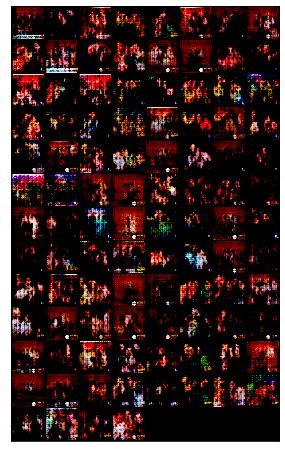

41 1 26 1.0527081489562988 1.1090307235717773
41 2 26 1.017984390258789 1.522412896156311
41 3 26 1.1027932167053223 1.4343599081039429
41 4 26 1.1031908988952637 1.3106030225753784
41 5 26 1.320457935333252 1.3631118535995483
41 6 26 1.1723659038543701 1.6133068799972534
41 7 26 1.068817138671875 1.2826714515686035
41 8 26 1.1460179090499878 1.3887600898742676
41 9 26 0.8841512203216553 1.8777462244033813
41 10 26 1.2700061798095703 0.7686287760734558
41 11 26 1.1830410957336426 1.784303903579712
41 12 26 1.1444921493530273 1.1919342279434204
41 13 26 1.2609822750091553 1.0256123542785645
41 14 26 1.1976690292358398 1.6947283744812012
41 15 26 1.1278895139694214 1.2533377408981323
41 16 26 1.107408046722412 1.1065078973770142
41 17 26 1.133773684501648 1.6273144483566284
41 18 26 1.0205774307250977 1.3352922201156616
41 19 26 0.9734518527984619 1.321452021598816
41 20 26 1.1413053274154663 1.3688833713531494
41 21 26 0.9481125473976135 1.4872636795043945
41 22 26 1.0297343730926514 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


41 26 26 1.1316990852355957 1.1842477321624756
Epoch: 41, D_Loss: 1.1316990852355957, G_Loss: 1.1842477321624756
(3, 860, 530)


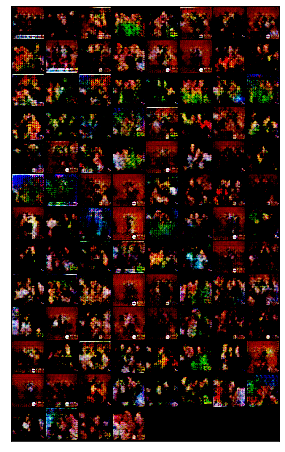

42 1 26 1.0866738557815552 1.5872676372528076
42 2 26 1.306403636932373 0.7902309894561768
42 3 26 1.4354116916656494 1.297624945640564
42 4 26 1.096402883529663 1.7630006074905396
42 5 26 1.3104238510131836 1.089279055595398
42 6 26 1.1220495700836182 1.2523852586746216
42 7 26 1.1042938232421875 1.544887661933899
42 8 26 1.1829224824905396 1.1336654424667358
42 9 26 1.181438684463501 2.012819766998291
42 10 26 1.2747842073440552 0.5703611969947815
42 11 26 1.4927453994750977 1.6839745044708252
42 12 26 1.0306227207183838 1.8561702966690063
42 13 26 1.3116071224212646 1.0371270179748535
42 14 26 1.190427541732788 0.9877152442932129
42 15 26 1.3004118204116821 1.4752812385559082
42 16 26 1.0674703121185303 1.4133661985397339
42 17 26 1.1148884296417236 1.0168994665145874
42 18 26 1.1829664707183838 1.437547206878662
42 19 26 1.1011580228805542 1.2697243690490723
42 20 26 1.0250685214996338 1.299595832824707
42 21 26 1.1882035732269287 1.1441460847854614
42 22 26 1.1819567680358887 1.23

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


42 26 26 1.1981863975524902 1.4874895811080933
Epoch: 42, D_Loss: 1.1981863975524902, G_Loss: 1.4874895811080933
(3, 860, 530)


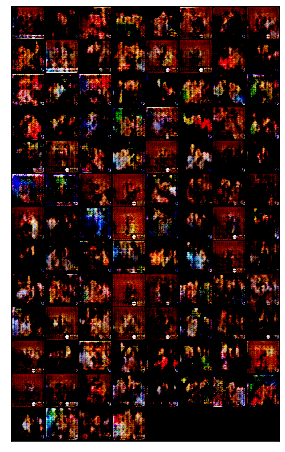

43 1 26 1.1113635301589966 1.2957212924957275
43 2 26 0.967727541923523 1.232136607170105
43 3 26 1.0724856853485107 1.912190556526184
43 4 26 1.1010230779647827 0.8339497447013855
43 5 26 1.2294108867645264 1.5922572612762451
43 6 26 1.204615592956543 1.644619107246399
43 7 26 1.3169093132019043 1.0192575454711914
43 8 26 1.3396904468536377 1.351714015007019
43 9 26 1.188435673713684 1.8021998405456543
43 10 26 1.1090953350067139 1.3454835414886475
43 11 26 1.059550404548645 1.758386254310608
43 12 26 1.1514853239059448 1.0493718385696411
43 13 26 1.1516034603118896 1.8148292303085327
43 14 26 1.2566314935684204 0.7121202349662781
43 15 26 1.2593858242034912 1.7916936874389648
43 16 26 1.1709529161453247 1.4510689973831177
43 17 26 1.115682601928711 1.1658527851104736
43 18 26 1.1800920963287354 1.3707391023635864
43 19 26 1.2310242652893066 1.5743217468261719
43 20 26 1.2158700227737427 1.2044159173965454
43 21 26 1.2333924770355225 1.2973337173461914
43 22 26 1.0912349224090576 1.68

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


43 26 26 1.0900752544403076 1.3122122287750244
Epoch: 43, D_Loss: 1.0900752544403076, G_Loss: 1.3122122287750244
(3, 860, 530)


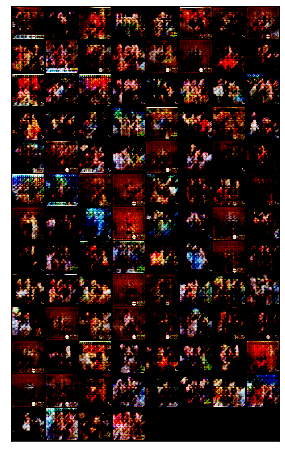

44 1 26 1.1023786067962646 1.5208981037139893
44 2 26 1.00228750705719 1.3795266151428223
44 3 26 1.1179665327072144 1.2825915813446045
44 4 26 1.1392889022827148 1.3322597742080688
44 5 26 1.1448076963424683 1.2693188190460205
44 6 26 1.2250604629516602 1.3194907903671265
44 7 26 1.1311960220336914 1.2637261152267456
44 8 26 1.1422381401062012 1.3858201503753662
44 9 26 1.1418437957763672 1.1894025802612305
44 10 26 1.1385128498077393 1.5361372232437134
44 11 26 1.1636515855789185 1.3941541910171509
44 12 26 1.0291534662246704 1.4790327548980713
44 13 26 1.1503241062164307 1.1040359735488892
44 14 26 1.2166707515716553 2.001802682876587
44 15 26 1.2900418043136597 0.542543888092041
44 16 26 1.3748140335083008 1.9332579374313354
44 17 26 0.9244825839996338 2.1748158931732178
44 18 26 1.2011536359786987 1.2415095567703247
44 19 26 1.2240798473358154 1.0216090679168701
44 20 26 1.222609519958496 1.486323595046997
44 21 26 1.0221455097198486 1.6313380002975464
44 22 26 0.9995381832122803 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


44 26 26 1.2061810493469238 1.4095786809921265
Epoch: 44, D_Loss: 1.2061810493469238, G_Loss: 1.4095786809921265
(3, 860, 530)


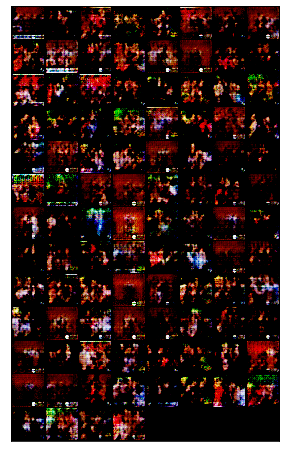

45 1 26 1.1312260627746582 1.3181426525115967
45 2 26 1.027578353881836 1.662950873374939
45 3 26 1.0423016548156738 1.42401921749115
45 4 26 1.0923805236816406 1.331161618232727
45 5 26 1.1743589639663696 1.4153610467910767
45 6 26 1.1694395542144775 1.2716875076293945
45 7 26 1.3404209613800049 1.1176615953445435
45 8 26 1.2193547487258911 1.5853478908538818
45 9 26 1.0860192775726318 1.5540788173675537
45 10 26 1.0271841287612915 1.3916041851043701
45 11 26 1.1455740928649902 1.4705405235290527
45 12 26 1.1412785053253174 1.3632714748382568
45 13 26 1.2246320247650146 1.3415690660476685
45 14 26 1.113814353942871 1.2788760662078857
45 15 26 1.1108691692352295 1.2020970582962036
45 16 26 1.168796181678772 1.643142819404602
45 17 26 0.9608734250068665 1.2426965236663818
45 18 26 1.0016509294509888 1.5034265518188477
45 19 26 1.1196138858795166 1.5164799690246582
45 20 26 1.0936139822006226 1.3667473793029785
45 21 26 1.1285951137542725 1.3250176906585693
45 22 26 1.2204642295837402 1.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


45 26 26 1.187577724456787 1.129105806350708
Epoch: 45, D_Loss: 1.187577724456787, G_Loss: 1.129105806350708
(3, 860, 530)


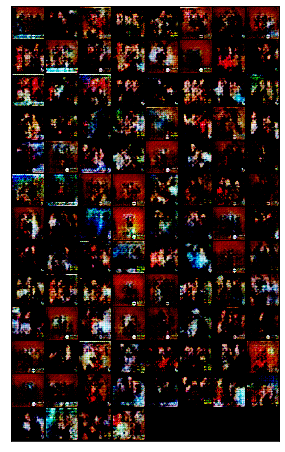

46 1 26 1.249321460723877 1.4604259729385376
46 2 26 1.1489633321762085 1.365859866142273
46 3 26 0.9339773058891296 1.7114101648330688
46 4 26 1.0489574670791626 1.4628719091415405
46 5 26 1.081545114517212 1.175917148590088
46 6 26 1.1071677207946777 1.4868394136428833
46 7 26 1.1229578256607056 1.4296282529830933
46 8 26 1.250284194946289 1.6443415880203247
46 9 26 1.2334003448486328 1.0707383155822754
46 10 26 1.199331521987915 1.6742137670516968
46 11 26 1.0598816871643066 1.4867541790008545
46 12 26 1.2172825336456299 1.2576470375061035
46 13 26 1.1210758686065674 1.5519413948059082
46 14 26 1.2726671695709229 1.2546677589416504
46 15 26 1.2651734352111816 1.733063817024231
46 16 26 1.0932531356811523 1.137662649154663
46 17 26 1.090315341949463 1.6138502359390259
46 18 26 1.0457007884979248 1.509955883026123
46 19 26 1.0679728984832764 1.03458833694458
46 20 26 1.1008250713348389 1.866485595703125
46 21 26 1.1725389957427979 0.9944419264793396
46 22 26 1.1148114204406738 1.52174

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


46 26 26 1.1480821371078491 1.4023067951202393
Epoch: 46, D_Loss: 1.1480821371078491, G_Loss: 1.4023067951202393
(3, 860, 530)


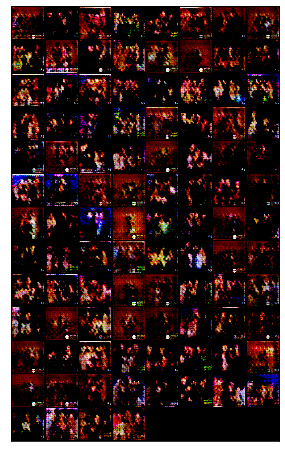

47 1 26 1.0967183113098145 1.4796142578125
47 2 26 1.1748650074005127 1.3052729368209839
47 3 26 1.0634287595748901 1.3655405044555664
47 4 26 1.077164888381958 1.5163215398788452
47 5 26 1.1796797513961792 1.526076078414917
47 6 26 1.1387803554534912 1.2923130989074707
47 7 26 1.1396567821502686 1.4460198879241943
47 8 26 1.2837156057357788 0.6597046852111816
47 9 26 1.3525440692901611 2.5956552028656006
47 10 26 1.753599762916565 0.5204915404319763
47 11 26 1.4838205575942993 1.3055367469787598
47 12 26 1.088437557220459 1.7099151611328125
47 13 26 1.249862551689148 1.055425763130188
47 14 26 1.1528205871582031 1.3154792785644531
47 15 26 0.996375560760498 1.6020965576171875
47 16 26 1.0512301921844482 1.4171779155731201
47 17 26 1.0588750839233398 1.3352371454238892
47 18 26 1.1771646738052368 1.5597277879714966
47 19 26 1.290355920791626 1.404043436050415
47 20 26 1.1697218418121338 1.505578637123108
47 21 26 1.2269549369812012 1.4042690992355347
47 22 26 1.156581163406372 1.360707

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


47 26 26 1.2963652610778809 1.1063508987426758
Epoch: 47, D_Loss: 1.2963652610778809, G_Loss: 1.1063508987426758
(3, 860, 530)


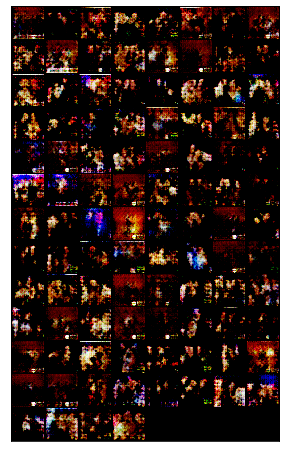

48 1 26 1.1669681072235107 1.4569964408874512
48 2 26 1.0780189037322998 1.3843616247177124
48 3 26 1.1165533065795898 1.4025944471359253
48 4 26 1.1769211292266846 1.0766981840133667
48 5 26 1.0754295587539673 1.290329098701477
48 6 26 1.1332734823226929 1.6136481761932373
48 7 26 1.118607521057129 1.026328444480896
48 8 26 1.200244665145874 1.2522025108337402
48 9 26 1.0956456661224365 1.5143828392028809
48 10 26 1.1934494972229004 1.0829983949661255
48 11 26 1.269527554512024 1.479586124420166
48 12 26 1.1016840934753418 1.5359989404678345
48 13 26 1.0678075551986694 1.095106601715088
48 14 26 1.0760935544967651 2.256118059158325
48 15 26 1.2589536905288696 0.49421852827072144
48 16 26 1.4732969999313354 1.8632770776748657
48 17 26 1.1532561779022217 1.6081827878952026
48 18 26 1.115753173828125 1.016252875328064
48 19 26 1.2373008728027344 1.5126818418502808
48 20 26 1.1759980916976929 1.480222463607788
48 21 26 1.1868877410888672 1.1861110925674438
48 22 26 1.1019567251205444 1.55

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


48 26 26 1.154508113861084 1.111682653427124
Epoch: 48, D_Loss: 1.154508113861084, G_Loss: 1.111682653427124
(3, 860, 530)


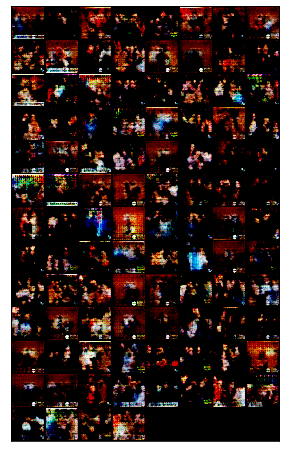

49 1 26 1.044559121131897 1.4382526874542236
49 2 26 1.1440420150756836 1.1416740417480469
49 3 26 1.0866758823394775 1.1917622089385986
49 4 26 1.0202043056488037 1.7125160694122314
49 5 26 1.270211935043335 0.8267408013343811
49 6 26 1.1805899143218994 1.5127458572387695
49 7 26 1.2468923330307007 1.2974493503570557
49 8 26 1.1431591510772705 1.369744062423706
49 9 26 1.1217546463012695 1.2653061151504517
49 10 26 1.0973315238952637 1.419081211090088
49 11 26 1.1629279851913452 1.277870535850525
49 12 26 1.0187013149261475 1.4365777969360352
49 13 26 1.1210541725158691 1.3299604654312134
49 14 26 1.1727635860443115 1.3884180784225464
49 15 26 1.1233766078948975 1.0956974029541016
49 16 26 1.1972129344940186 1.4197643995285034
49 17 26 1.2592155933380127 1.286008596420288
49 18 26 1.07535982131958 1.5629403591156006
49 19 26 1.0573827028274536 1.1785807609558105
49 20 26 1.0524120330810547 1.913681149482727
49 21 26 1.2124313116073608 0.5299671292304993
49 22 26 1.3890275955200195 1.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


49 26 26 1.2070534229278564 1.2938953638076782
Epoch: 49, D_Loss: 1.2070534229278564, G_Loss: 1.2938953638076782
(3, 860, 530)


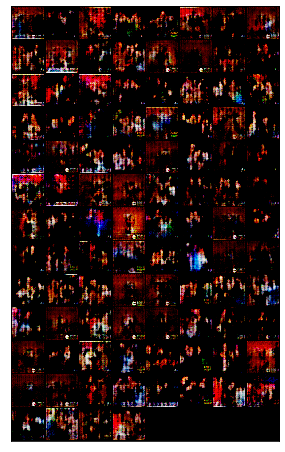

In [12]:
# Training Loop

print("Starting Training Loop...")
# For each epoch
for epoch in range(EPOCHS):
  counter = 0
  # For each batch in the dataloader
  for image_batch, data in dataloader:
    b_size = len(data)
    #Train with real
    label = torch.full((b_size,), real_label, device=device)

    D.zero_grad()

    output = D(image_batch.to(device))
    errD_real = loss_function(output, label)
    errD_real.backward()
    D_x = output.mean().item()

    #Train with fake
    noise = torch.randn(b_size, nz, 1, 1, device=device)
    fake = G(noise)
    label.fill_(fake_label)
    output = D(fake.detach())
    errD_fake = loss_function(output, label)
    errD_fake.backward()

    #D_G_z1 = output.mean().item()
    errD = errD_real + errD_fake
    D_solver.step()

    #Update G network

    G.zero_grad()
    label.fill_(real_label)
    output = D(fake)
    errG = loss_function(output, label)
    errG.backward()
    #D_G_z2 = output.mean().item()
    G_solver.step()

    counter += 1

    print(epoch, counter, len(dataloader), errD.item(), errG.item())
          

  with torch.no_grad():
    print("Epoch: {}, D_Loss: {}, G_Loss: {}".format(epoch, errD.item(), errG.item()))
    samples = G(fixed_noise).detach()
    samples = samples.view(samples.size(0), nc, img_size, img_size)
    imshow(samples)
     
